<a href="https://colab.research.google.com/github/AlexVonSchwerdtner/BA780-Team6/blob/main/Boston_Crime_Scene_Analytics_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [88]:
%%html
<marquee style='width: 30%; color: blue;'><b>Welcome to Boston Crime Scene Analytics!</b></marquee>

#*BA780 - Team 6*
## Team Project - Exploratory Data Analysis

*Alex von Schwerdtner, Keshuo Liu, Subhiksha Sivasubramanian, Zijing Wang, Weiyang Bao*

<img src="https://github.com/AlexVonSchwerdtner/BA780-Team6/blob/859eda2c400da728f46d9d541d23fb19c57805e3/Analyze%20Boston.png?raw=true" width="600" align="center"/>

*Image from [Analyze Boston](https://medium.com/news-stories-from-boston-open-data/official-launch-of-analyze-boston-coming-april-6th-b7513fd58aae)

---
#**Boston Crime Scene Analytics**
---

### *Executive Summary*
**REVISE**

###*Problem definition:*

As current students living in the Boston Area we are interested in analyzing the Boston Crime Scene. We would like to analyze and discover what types of crimes are most common, where the different types of crimes are most likely to occur, and if the frequency of crimes change over specific time spans (e.g. day, week & year). Our mission is to answer questions like “where a person is most likely to be a victim of a crime at a certain time of day, specific months or seasons of a given year?”

## **Data**
*Crime Incident Reports (2016 - To Date)*

The Data was downloaded from [Analyze Boston](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system)

*Crime incident reports are provided by Boston Police Department (BPD) to document the initial details surrounding an incident to which BPD officers respond. This is a dataset containing records from the new crime incident report system, which includes a reduced set of fields focused on capturing the type of incident as well as when and where it occurred. Records in the new system begin in June of 2015.*

Each row represents a specific crime report, including: the type of crime, date and time, and location.

* **INCIDENT_NUMBER**: Unique incident number for a specific crime report
* **OFFENSE_CODE**: Offense code of the incident (integer)
* **OFFENSE_CODE_GROUP**: Group of offense
* **OFFENSE_DESCRIPTION**: Description of the offense
* **DISTRICT**: Reporting district in Boston
* **REPORTING_AREA**: Reporting Area (integer)
* **SHOOTING**: Whether a shooting occured or not (1,0)
* **OCCURRED_ON_DATE**: Date of incident (TIMESTAMP)
* **YEAR**: Year of incident (integer)
* **MONTH**: Month of incident (integer)
* **DAY_OF_WEEK**: Day of the week of incident
* **HOUR**: Hour of incident (integer)
* **UCR_PART**: Uniform Crime Code Parts (Part One, Part Two, Part Three)
* **STREET**: Street name of incident
* **Lat**: Latitude of the incident (float)
* **Long**: Longitude of the incident (float)
* **Location**: Combined latitude and longitude of the incident


### *Year of **2019** (incomplete DATA)*
* Because Boston Police Department reported that data for 2019 only starts from September due to change of database system used, yearly, monthly and seasonly analysis in this project will expluse 2019. 


### **Basic information of Datasets used**:

*Crime Dataset*
* 440,684 rows
* There are 17 columns

*Holiday Dataset*
* 342 rows
* There are 6 columns with
* No missing values in this dataset
* Some rows have same date with different holidays

---
*We will be using Matplotlib, Seaborn, Plotly and Folium library, Ipywidgets to plot and analyze the data.*



## Content
---
1.   **Setup**
2.   **Data Cleaning & Pre-Processing**
3.  **Exploration**

*   *By Year*
*   *By Season*
*   *By Holiday*
*   *By Hour and Weekday*
*   *By Offense Type*
*   *By Street*
*   *By District*
*   *Map*
*   *Heat Map*

4.   **Findings**

5.   **Further Analysis**
---


### *Preview of Cleaned and Pre-Processed Data*

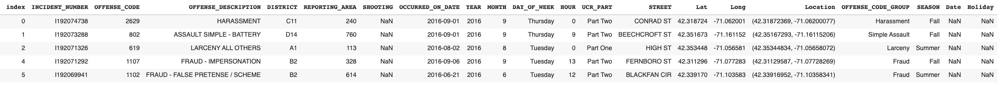

# **Setup**

## *Importing Required Packages*

In [89]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
from ipywidgets import widgets, interactive

In [90]:
# displaying all columns and 5 rows of panda data frames
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',5)

## *Reading all files to the environment from GoogleCloudStorage Bucket*

In [91]:
# Accessing files from the Google Cloud Storage Bucket
from google.cloud import storage
from google.colab import auth
auth.authenticate_user()

In [92]:
# Reading files to the environment from the Google Cloud Storage Bucket
def download_blob(file_name):
    """Downloads a blob from the bucket."""
    project_id = 'ba-780-team6-a1'
    bucket_name = 'ba780-team6-a1'

    storage_client = storage.Client(project_id)

    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(file_name)
    blob.download_to_filename(file_name)

    print(
        "Blob {} downloaded to {}.".format(
            file_name, file_name
        )
    )
download_blob('crime-incident-reports-2016.csv')
download_blob('crime-incident-reports-2017.csv')
download_blob('crime-incident-reports-2018.csv')
download_blob('crime-incident-reports-2019.csv')
download_blob('crime-incident-reports-2020.csv')
download_blob('crime-incident-reports-2021.csv')
download_blob('US Holiday Dates (2004-2021).csv')

Blob crime-incident-reports-2016.csv downloaded to crime-incident-reports-2016.csv.
Blob crime-incident-reports-2017.csv downloaded to crime-incident-reports-2017.csv.
Blob crime-incident-reports-2018.csv downloaded to crime-incident-reports-2018.csv.
Blob crime-incident-reports-2019.csv downloaded to crime-incident-reports-2019.csv.
Blob crime-incident-reports-2020.csv downloaded to crime-incident-reports-2020.csv.
Blob crime-incident-reports-2021.csv downloaded to crime-incident-reports-2021.csv.
Blob US Holiday Dates (2004-2021).csv downloaded to US Holiday Dates (2004-2021).csv.


## *Loading Data to variables*

In [93]:
# Reading the crime data sets to the environement
crimes2016 = pd.read_csv('crime-incident-reports-2016.csv')
crimes2017 = pd.read_csv('crime-incident-reports-2017.csv')
crimes2018 = pd.read_csv('crime-incident-reports-2018.csv')
crimes2019 = pd.read_csv('crime-incident-reports-2019.csv')
crimes2020 = pd.read_csv('crime-incident-reports-2020.csv')
crimes2021 = pd.read_csv('crime-incident-reports-2021.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [94]:
# reading the US holidays to the environment
holidays = pd.read_csv('US Holiday Dates (2004-2021).csv')

## *Concatenating all crime datasets (Years 2016 - 2021)*

In [95]:
# concatenating all crime datasets (excluded crimes2015)
frames = [crimes2016,crimes2017,crimes2018,crimes2019,crimes2020,crimes2021]
Crimes_all_years = pd.concat(frames)
Crimes_all_years.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 440684 entries, 0 to 50351
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      440684 non-null  object 
 1   OFFENSE_CODE         440684 non-null  int64  
 2   OFFENSE_CODE_GROUP   299656 non-null  object 
 3   OFFENSE_DESCRIPTION  440684 non-null  object 
 4   DISTRICT             437693 non-null  object 
 5   REPORTING_AREA       440684 non-null  object 
 6   SHOOTING             142232 non-null  object 
 7   OCCURRED_ON_DATE     440684 non-null  object 
 8   YEAR                 440684 non-null  int64  
 9   MONTH                440684 non-null  int64  
 10  DAY_OF_WEEK          440684 non-null  object 
 11  HOUR                 440684 non-null  int64  
 12  UCR_PART             299561 non-null  object 
 13  STREET               430070 non-null  object 
 14  Lat                  420282 non-null  float64
 15  Long              

In [96]:
# EXPORT TO CSV
Crimes_all_years.to_csv('crimes_all_years.csv')

# **Data Cleaning & Pre-Processing**

## *Cleaning*

**Explanation of Cleaning Process**


1.   Duplicated crime cases with the same INCIDENT_NUMBER have been dropped and only keep the first row.
2.   Missing values of the OFFENSE_CODE_GROUP have been filled with existing values for the same OFFENSE_CODE or with the first category in OFFENSE_DESCRIPTION if no applicable historical data.
3. Checking (0,0) location values for latitude and longitude. Due to its presence those values have been excluded from the actual dataframe for creating a mark cluster map. A new dataframe called 'df1' has been created for map marking purposes.





In [97]:
# Number of unique crime incidents
len(Crimes_all_years['INCIDENT_NUMBER'].unique())

405242

In [98]:
# checking for duplicates
print(len(Crimes_all_years))
print(len(Crimes_all_years.drop_duplicates(subset='INCIDENT_NUMBER', keep='first')))

440684
405242


In [99]:
# dropping duplicates
Crimes_all_years = Crimes_all_years.drop_duplicates(subset='INCIDENT_NUMBER', keep='first').reset_index()
print(len(Crimes_all_years))

405242


In [100]:
# filling the NA's in the 'OFFENSE_CODE_GROUP' with non-na 'OFFENSE_CODE_GROUP' of the same 'OFFENSE_CODE' previously used, 
# or replace with the first category in 'OFFENSE_DESCRIPTION' if no applicable historical data
OFFENSE_CODE = Crimes_all_years[Crimes_all_years.OFFENSE_CODE_GROUP.isna()==False]
OFFENSE_CODE = OFFENSE_CODE.drop_duplicates(subset='OFFENSE_CODE', keep='first').reset_index()
OFFENSE_CODE = OFFENSE_CODE[['OFFENSE_CODE','OFFENSE_CODE_GROUP']]
Crimes_all_years = Crimes_all_years.merge(OFFENSE_CODE,on='OFFENSE_CODE',how='left')
Crimes_all_years['OFFENSE_CODE_GROUP']=Crimes_all_years.OFFENSE_CODE_GROUP_y
Crimes_all_years = Crimes_all_years.drop(columns=['OFFENSE_CODE_GROUP_x','OFFENSE_CODE_GROUP_y'])
def fill(a):
    if a.find(' - ') == -1:
        return a.title()
    elif a.find('SICK ASSIST') != -1:
        return 'Medical Assitance'
    else:
        return a.title()[:(a.find(' - '))]
Crimes_all_years.loc[Crimes_all_years.OFFENSE_CODE_GROUP.isna()==True,'OFFENSE_CODE_GROUP'] = Crimes_all_years[Crimes_all_years.OFFENSE_CODE_GROUP.isna()==True].OFFENSE_DESCRIPTION.apply(fill)
print(len(Crimes_all_years))

405242


In [101]:
# missing values in Lat column
Crimes_all_years[Crimes_all_years['Lat'].isnull()]

,index,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,OFFENSE_CODE_GROUP
21,25,I192029756,3201,PROPERTY - LOST,B2,,NaN,2016-04-23 11:24:00,2016,4,Saturday,11,Part Three,RUGGLES ST,NaN,NaN,"(0.00000000, 0.00000000)",Property Lost
70,75,I182056106,1102,FRAUD - FALSE PRETENSE / SCHEME,D14,,NaN,2016-04-24 01:20:00,2016,4,Sunday,1,Part Two,CAMBRIDGE ST,NaN,NaN,"(0.00000000, 0.00000000)",Fraud
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264187,98803,I172002908,802,ASSAULT SIMPLE - BATTERY,A1,,NaN,2018-01-16 16:00:00,2018,1,Tuesday,16,Part Two,NaN,NaN,NaN,"(0.00000000, 0.00000000)",Simple Assault
264211,98873,I110611058-00,3125,WARRANT ARREST,A1,,NaN,2018-08-29 17:00:00,2018,8,Wednesday,17,Part Three,CAMBRIDGE ST,NaN,NaN,"(0.00000000, 0.00000000)",Warrant Arrests


In [102]:
# missing values in Long column
Crimes_all_years[Crimes_all_years['Long'].isnull()]

,index,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,OFFENSE_CODE_GROUP
21,25,I192029756,3201,PROPERTY - LOST,B2,,NaN,2016-04-23 11:24:00,2016,4,Saturday,11,Part Three,RUGGLES ST,NaN,NaN,"(0.00000000, 0.00000000)",Property Lost
70,75,I182056106,1102,FRAUD - FALSE PRETENSE / SCHEME,D14,,NaN,2016-04-24 01:20:00,2016,4,Sunday,1,Part Two,CAMBRIDGE ST,NaN,NaN,"(0.00000000, 0.00000000)",Fraud
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264187,98803,I172002908,802,ASSAULT SIMPLE - BATTERY,A1,,NaN,2018-01-16 16:00:00,2018,1,Tuesday,16,Part Two,NaN,NaN,NaN,"(0.00000000, 0.00000000)",Simple Assault
264211,98873,I110611058-00,3125,WARRANT ARREST,A1,,NaN,2018-08-29 17:00:00,2018,8,Wednesday,17,Part Three,CAMBRIDGE ST,NaN,NaN,"(0.00000000, 0.00000000)",Warrant Arrests


In [103]:
# missing values in DISTRICT column
Crimes_all_years[Crimes_all_years['DISTRICT'].isnull()]

,index,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,OFFENSE_CODE_GROUP
13,16,I192043111,1102,FRAUD - FALSE PRETENSE / SCHEME,NaN,,NaN,2016-04-24 01:20:00,2016,4,Sunday,1,Part Two,NaN,42.351834,-71.110764,"(42.35183419, -71.11076425)",Fraud
66,71,I182059591,1107,FRAUD - IMPERSONATION,NaN,,NaN,2016-05-01 08:00:00,2016,5,Sunday,8,Part Two,HOWARD,-1.000000,-1.000000,"(-1.00000000, -1.00000000)",Fraud
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
405218,50328,210026907,1832,SICK ASSIST - DRUG RELATED ILLNESS,NaN,178,0,2021-01-19 13:59:00,2021,1,Tuesday,13,NaN,POMPEII ST,42.329695,-71.070444,"(42.3296947119465, -71.0704440989647)",Drug Violation
405233,50343,201906722,2610,TRESPASSING,NaN,,0,2021-06-13 18:23:00,2021,6,Sunday,18,NaN,WESLEYAN PLACE,0.000000,0.000000,"(0, 0)",Other


## *Data Pre-Processing*

**Explanation of Data Pre-Processing Steps**
1.   SEASON column has been added based on the MONTH of each criminal case.
2.   OCCURRED_ON_DATE column has been transformed from string to timestamp.date.
3.   Holiday column has been added by using the merge() function 

In [104]:
# adding SEASON column
Crimes_all_years['SEASON']=None
Crimes_all_years.loc[Crimes_all_years['MONTH'].isin([3,4,5]),'SEASON']='Spring'
Crimes_all_years.loc[Crimes_all_years['MONTH'].isin([6,7,8]),'SEASON']='Summer'
Crimes_all_years.loc[Crimes_all_years['MONTH'].isin([9,10,11]),'SEASON']='Fall'
Crimes_all_years.loc[Crimes_all_years['MONTH'].isin([12,1,2]),'SEASON']='Winter'

In [105]:
# transforming OCCURRED_ON_DATE from str to timestemp.date
def date(time):
    return time.date()

Crimes_all_years['OCCURRED_ON_DATE']=pd.to_datetime(Crimes_all_years['OCCURRED_ON_DATE'],format='%Y-%m-%d %H:%M:%S')
Crimes_all_years['OCCURRED_ON_DATE']=Crimes_all_years['OCCURRED_ON_DATE'].apply(date)

In [106]:
# adding Holiday columns (showing the name of holiday if exists, otherwise missing value)
holidays.loc[(holidays.Holiday=='Labor Day Weekend') & (holidays.WeekDay=='Saturday'),'Holiday']='Labor Day Weekend Sat'
holidays.loc[(holidays.Holiday=='Labor Day Weekend') & (holidays.WeekDay=='Sunday'),'Holiday']='Labor Day Weekend Sun'
holidays = holidays[['Date','Holiday']]
holidays['Date'] = pd.to_datetime(holidays['Date'],format='%Y-%m-%d')
holidays['Date'] = holidays['Date'].apply(date)
crimes_holidays = Crimes_all_years.merge(holidays, left_on='OCCURRED_ON_DATE',right_on='Date',how='left')

In [107]:
# result with holiday information is saved and used later on individually 
# because there're duplicated incident numbers after merging resulting from having two holidays on the same day
len(crimes_holidays.INCIDENT_NUMBER)

405469

# **Exploration**

## General Overview of Top Boston Criminal Cases

In [108]:
# top-5 frequent criminal report types
dftop6 = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby('OFFENSE_CODE_GROUP').size().to_frame('count').sort_values(by='count', ascending=False).head(6).reset_index()
dftop6 = dftop6.drop([5])
dftop6

,OFFENSE_CODE_GROUP,count
0,Motor Vehicle Accident Response,49800
1,Larceny,32323
2,Medical Assistance,29260
3,Investigate Person,27142
4,Vandalism,18846


In [109]:
# number of crimes over offense groups by year

df = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['OFFENSE_CODE_GROUP','YEAR'])['INCIDENT_NUMBER'].count().reset_index()
df = df.sort_values(by=['YEAR','INCIDENT_NUMBER'], ascending=False)
df = df[df['OFFENSE_CODE_GROUP'].isin(dftop6.OFFENSE_CODE_GROUP)]

df[df.YEAR==2021]

,OFFENSE_CODE_GROUP,YEAR,INCIDENT_NUMBER
195,Motor Vehicle Accident Response,2021,7333
137,Investigate Person,2021,4630
153,Larceny,2021,4170
296,Vandalism,2021,2464
180,Medical Assistance,2021,2454


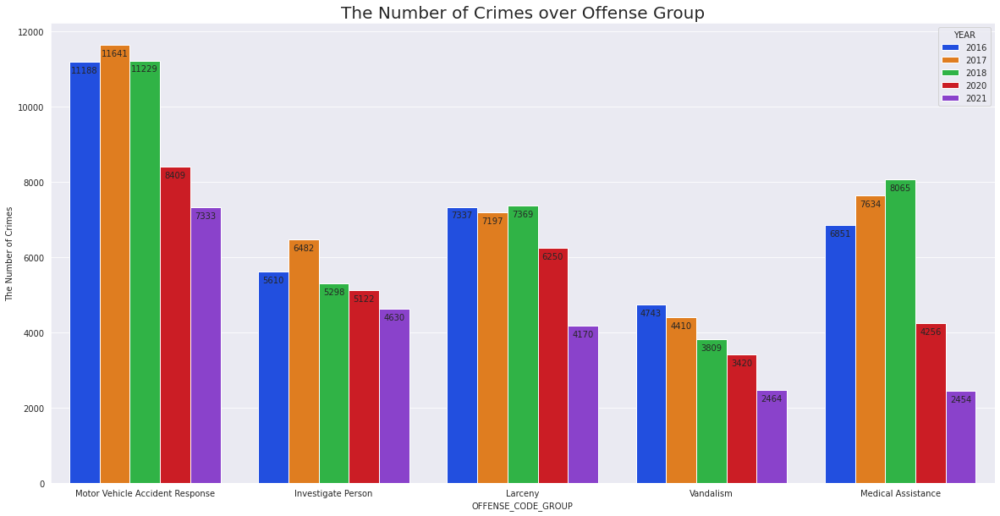

In [110]:
plt.figure(figsize= (20,10))
fig1 = sns.barplot(data=df, x='OFFENSE_CODE_GROUP', y='INCIDENT_NUMBER', hue='YEAR')
plt.ylabel('The Number of Crimes')
plt.title('The Number of Crimes over Offense Group', fontsize=20)

for i in fig1.patches:
    fig1.annotate(format(int(i.get_height())), 
                   (i.get_x() + i.get_width() / 2, i.get_height()), 
                   ha = 'center', va = 'center', 
                   size=10,
                   xytext = (0, -10), 
                   textcoords = 'offset points')
    
plt.show()


*   In general, we can see that the top 5 incidents over the course of the years include: Motor Vehicle Accident Response, Investigate Person, Larceny, Vandalism & Medical Assistance.
* Clear trend throughout the top 5 incidents of decreasing number of total Number of Crimes from 2018-2021

## By Year

###A general overview of criminal cases in different years

Because Boston Police Department reported that criminal report data for 2019 only begins from September due to the change of database system used, the following visualization will exclude 2019.

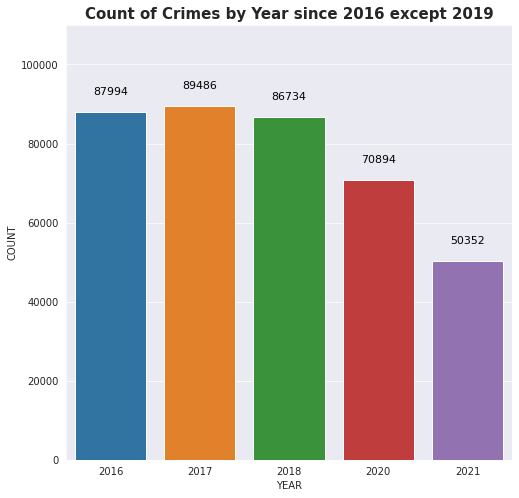

In [111]:
sns.set_context({"figure.figsize":(8,8)})
crimes_year = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby('YEAR').INCIDENT_NUMBER.agg(count='count')
crimes_year = pd.DataFrame({'YEAR':crimes_year.index,'COUNT':crimes_year['count']})
ax = sns.barplot(x=crimes_year.YEAR,y=crimes_year.COUNT,palette='tab10')
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 20),
                textcoords='offset points')
ax.set(ylim=(0, 110000))
ax.set_title('Count of Crimes by Year since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   Although 2019 is not showed, it is clear that the crime cases decreased since 2020, probably due to the COVID-19 pendamic.



## By Season

###Which season had the most crimes?

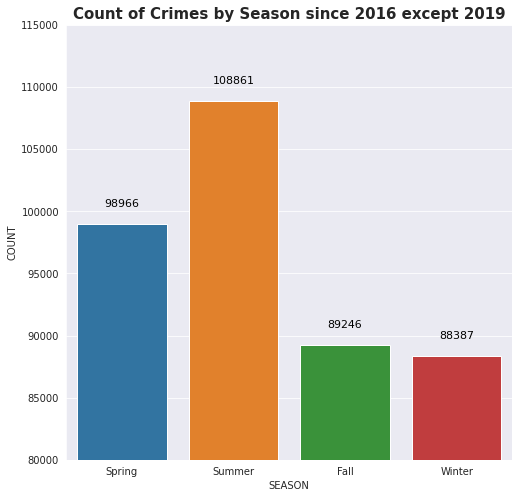

In [112]:
sns.set_context({"figure.figsize":(8,8)})
crimes_season = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby('SEASON')['index'].agg(count='count')
crimes_season = crimes_season.reindex(['Spring','Summer','Fall','Winter'])
crimes_season = pd.DataFrame({'SEASON':crimes_season.index,'COUNT':crimes_season['count']})
ax = sns.barplot(x=crimes_season.SEASON,y=crimes_season.COUNT,palette='tab10')
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 20),
                textcoords='offset points')
ax.set(ylim=(80000, 115000))
ax.set_title('Count of Crimes by Season since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});


*   In general, crimes occurred more in Summer and Spring.



###What were the most dangerous hours in a specific season?

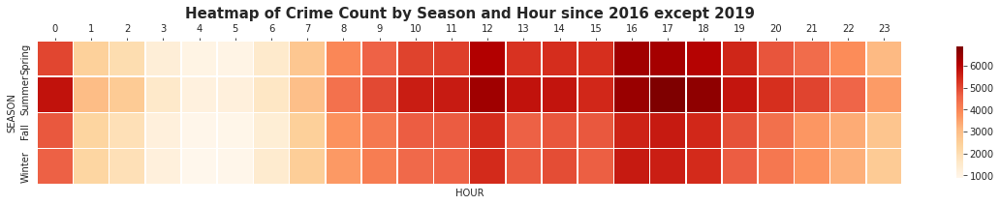

In [113]:
sns.set_context({"figure.figsize":(20,5)})
crimes_season_hour = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['SEASON','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
crimes_season_hour = crimes_season_hour.reindex(['Spring','Summer','Fall','Winter'])
ax = sns.heatmap(crimes_season_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.5}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Crime Count by Season and Hour since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   The most frequent times for crimes in terms of season and hour were noon and evening in Spring and Sumemr, and midnight in Summer.



## By Holiday

###Which holidays have a high crime rate and which have a low crime rate?

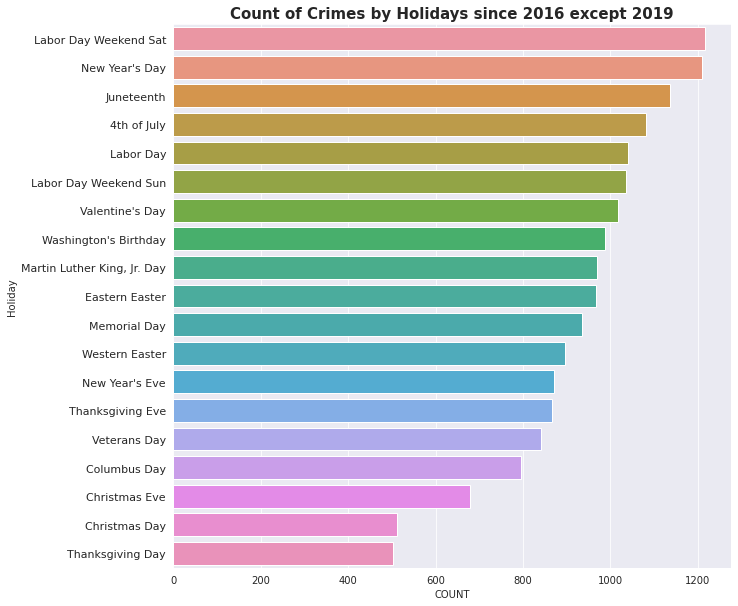

In [114]:
sns.set_context({"figure.figsize":(10,10)})
crimes_holiday=crimes_holidays[(crimes_holidays.YEAR!=2019) & (crimes_holidays.Holiday.isna()==False)].groupby('Holiday').INCIDENT_NUMBER.agg(count = 'count').sort_values(by='count',ascending=False)

crimes_holiday = pd.DataFrame({'Holiday':crimes_holiday.index,'COUNT':crimes_holiday['count']})
ax = sns.barplot(y=crimes_holiday.Holiday,x=crimes_holiday.COUNT)
ax.set_title('Count of Crimes by Holidays since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'})
ax.set_yticklabels(ax.get_yticklabels(),fontdict={'fontsize':11});



*   Since 2016 except 2019, Labor Day Weekend Saturday and New Year's Day have the largest number of crime cases, while Cristmas and Tranksgiving have few crime cares.



## By Hour and Weekday

###During what time of day do criminal incidents frequently occur？

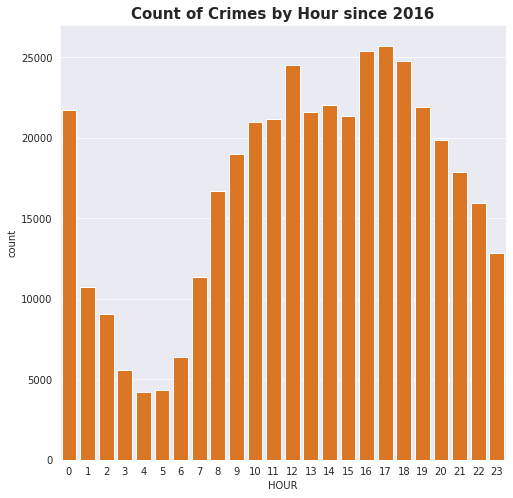

In [115]:
crimes_hour = Crimes_all_years.groupby('HOUR').size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
sns.set_style('darkgrid')
sns.set_context({"figure.figsize":(8,8)})
ax = sns.barplot(data=crimes_hour,x='HOUR',y='count',color='#F97306')
ax.set_title('Count of Crimes by Hour since 2016',fontdict= {'fontsize':15, 'fontweight':'bold'});

*   From the hourly crime count bar chart above, it is obvious that crimes more often occurred during daytimes than nighttimes, especially at 12 pm and 4-6 pm. Also, midnight am was the most frequent hour for crime reports at night.

###Did this pattern vary a lot in different years?

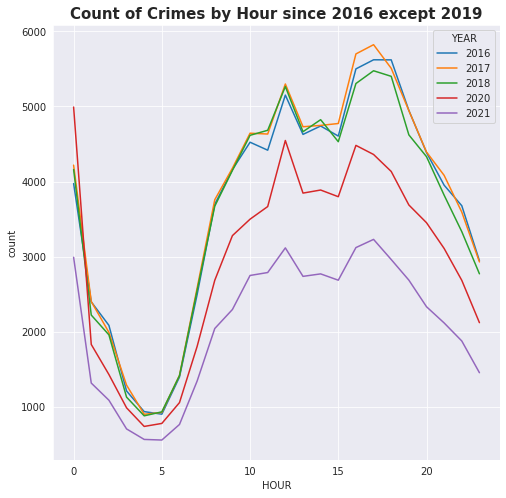

In [116]:
crimes_hour = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['HOUR','YEAR']).size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
ax = sns.lineplot(data=crimes_hour,x='HOUR',y='count',hue='YEAR',palette='tab10')
sns.set_context({"figure.figsize":(8,8)})
ax.set_title('Count of Crimes by Hour since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   From the above line chart, 2016 to present, except 2019 which is excluded because of missing data, generally have the same pattern on active hour of crime cases. 



###During which day of week do criminal cases frequently occur？

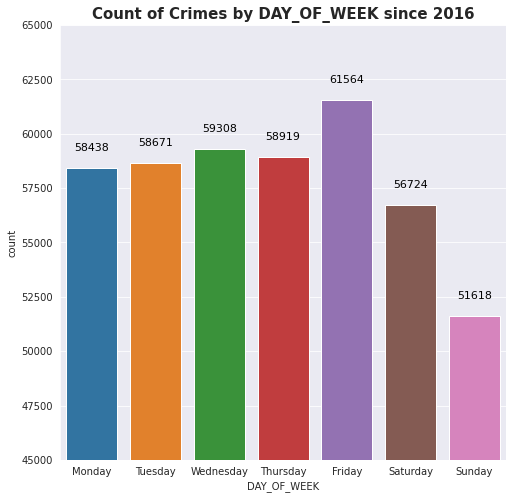

In [117]:
crimes_weekday = Crimes_all_years.groupby('DAY_OF_WEEK').size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
crimes_weekday = crimes_weekday.reindex([4,3,1,2,0,5,6])
sns.set_palette('bright')
ax = sns.barplot(data=crimes_weekday,x='DAY_OF_WEEK',y='count',palette='tab10')
ax.set_title('Count of Crimes by DAY_OF_WEEK since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'})
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 20),
                textcoords='offset points')
ax.set_ylim(45000,65000);


*   From the day_of_week crime count above, we can see that Friday had the most crime cases where there were less cases on weekend.



###What were the most dangerous hours on certain days of a week?

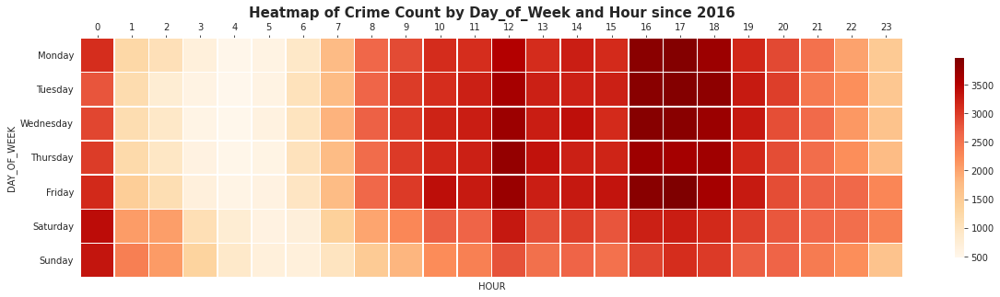

In [118]:
sns.set_context({"figure.figsize":(20,5)})
crimes_weekday_hour = Crimes_all_years.groupby(['DAY_OF_WEEK','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
crimes_weekday_hour = crimes_weekday_hour.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_weekday_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Crime Count by Day_of_Week and Hour since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   The heatmap shows that crimes frequently occured durring daytime on weekdays, especially at noon and between 4 and 6 pm. In weekends, 0 am had the largest number of crimes. 



## By Offense Type

###What were the most commonly occurred crimes?

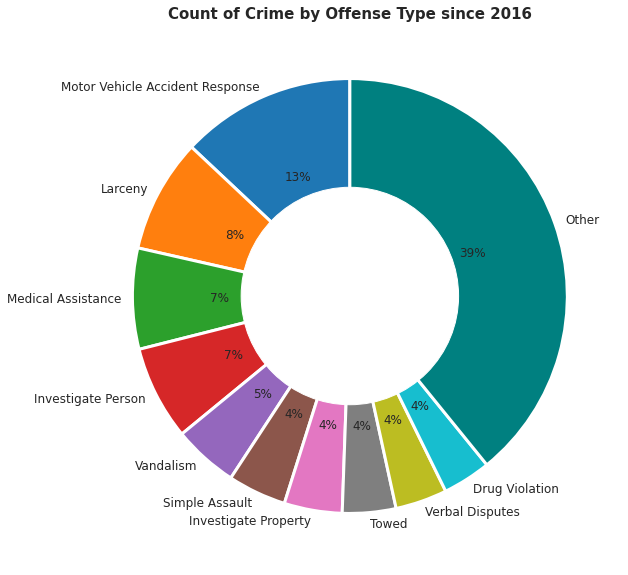

In [119]:
sns.set_context({"figure.figsize":(10,10)})
crimes_rank = Crimes_all_years.groupby('OFFENSE_CODE_GROUP').size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
crimes_rank_10 = crimes_rank[crimes_rank.OFFENSE_CODE_GROUP!='Other'][:10]
other = sum(crimes_rank['count'])-sum(crimes_rank_10['count'])
crimes_rank_10 = pd.concat([crimes_rank_10,pd.DataFrame({'OFFENSE_CODE_GROUP':['Other'],'count':[other]})],ignore_index=True)
plt.pie(crimes_rank_10['count'],labels=crimes_rank_10.OFFENSE_CODE_GROUP,startangle=90, labeldistance=1.05,\
        wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },\
        colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf','#008080'],\
        textprops={'fontsize': 12},autopct='%1.0f%%')
my_circle=plt.Circle( (0,0), 0.5, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('Count of Crime by Offense Type since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'})
plt.show()



*   According to the donnut chart, Motor Vehicle Accident Response, Larceny, Medical Assistance were the top-3 crime report cases since 2016.



###Motor Vehicle Accidents, the most frequent case type, were more likely to be reported at what time?

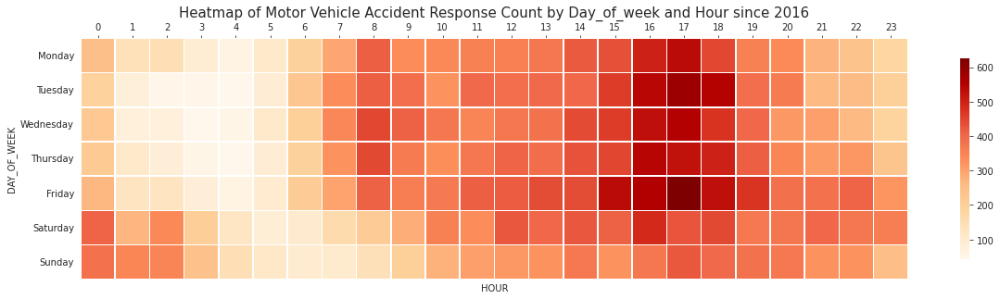

In [120]:
sns.set_context({"figure.figsize":(20,5)})
crimes_weekday_hour = Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response'].groupby(['DAY_OF_WEEK','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
crimes_weekday_hour = crimes_weekday_hour.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_weekday_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Motor Vehicle Accident Response Count by Day_of_week and Hour since 2016', fontdict= {'fontsize':15});



*   Motor Vehicle Accident Response were morelikely to occur between 16 and 18 pm from Monday to Thursday. On Friday, it occurred more frequent between 15 to 18 pm. At weekend's nights, the cases occurred more often than at weekday nights between 0 to 2 am.



###Feel free to explore other heapmaps below with different year, offense type, reporting district and street.

In [121]:
# Creating an interactive heapmap with options of year, offense type, reporting district and incident street.
Year = widgets.Dropdown(
    options=['All'] + list(np.sort(Crimes_all_years.YEAR.unique())),
    value='All',
    description='Year:',
)
Type = widgets.Dropdown(
    options=['All'] + list(Crimes_all_years.groupby('OFFENSE_CODE_GROUP').INCIDENT_NUMBER.agg(Count='count').sort_values(by='Count',ascending=False).index),
    value='All',
    description='Crime:',
)
Street = widgets.Dropdown(
    options=['All'] + list(Crimes_all_years.groupby('STREET').INCIDENT_NUMBER.agg(Count='count').sort_values(by='Count',ascending=False).index),
    value='All',
    description='Street:'
)
District = widgets.Dropdown(
    options=['All'] + list(np.sort(Crimes_all_years[Crimes_all_years.DISTRICT.isna()==False].DISTRICT.unique())),
    value='All',
    description='Report Dist:'
)

def update_street(*args):
    if (Street.value=='All') & (District.value!='All'):
        Street.options = ['All'] + list(Crimes_all_years[Crimes_all_years.DISTRICT==District.value].groupby('STREET').INCIDENT_NUMBER.agg(Count='count').sort_values(by='Count',ascending=False).index)

def update_district(*args):
    if (District.value=='All') & (Street.value!='All'):
        District.options = ['All'] + list(np.sort(Crimes_all_years[(Crimes_all_years.STREET==Street.value) & (Crimes_all_years.DISTRICT.isna()==False)].DISTRICT.unique()))

District.observe(update_street, 'value')
Street.observe(update_district,'value')

def plotit(Type, District, Street, Year):
    dd = Crimes_all_years.copy()
    if Year != 'All':
        dd = dd[dd.YEAR == Year]
    if Type != 'All':
        dd = dd[dd.OFFENSE_CODE_GROUP == Type]
    if District != 'All':
        dd = dd[dd.DISTRICT == District]
    if Street != 'All':
        dd = dd[dd.STREET == Street]
    # Plot it (only if there's data to plot)
    if len(dd) > 0:
        sns.set_context({"figure.figsize":(20,5)})
        dd = dd.groupby(['DAY_OF_WEEK','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
        dd = dd.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
        ax = sns.heatmap(dd,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
        ax.xaxis.tick_top()
        ax.set_title('Count of Crime by Day_of_Week and Hour \nYear={}, Offense Type={}, District={}, Street={}'.format(Year, Type, District, Street), fontdict= {'fontsize':15, 'fontweight':'bold'})
        plt.show();
    else:
        print("No data to show for current selection.")

interactive(plotit, Year=Year, Type=Type, District=District, Street=Street)

interactive(children=(Dropdown(description='Crime:', options=('All', 'Motor Vehicle Accident Response', 'Larce…

## By Street

###Top 5 frequent streets

In [122]:
street_rank = Crimes_all_years.groupby('STREET').INCIDENT_NUMBER.agg(count='count').sort_values(by='count',ascending=False)[:5]
street_rank

,count
STREET,
WASHINGTON ST,19100
BLUE HILL AVE,9391
BOYLSTON ST,7643
TREMONT ST,5956
DORCHESTER AVE,5930


###Top 5 frequent streets for Motor Vehicle Accidents

In [123]:
Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response'].groupby('STREET')['index'].agg(count='count').sort_values(by='count',ascending=False).head(5)

,count
STREET,
WASHINGTON ST,1805
BLUE HILL AVE,1618
DORCHESTER AVE,994
CENTRE ST,795
HYDE PARK AVE,764


###Top 5 frequent streets for Larceny

In [124]:
Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Larceny'].groupby('STREET')['index'].agg(count='count').sort_values(by='count',ascending=False).head(5)

,count
STREET,
WASHINGTON ST,2695
BOYLSTON ST,2531
NEWBURY ST,1222
HUNTINGTON AVE,992
TREMONT ST,747


###Top 5 frequent streets for Medical Assistance cases

In [125]:
Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Medical Assistance'].groupby('STREET')['index'].agg(count='count').sort_values(by='count',ascending=False).head(5)

,count
STREET,
WASHINGTON ST,1356
CENTRE ST,526
BLUE HILL AVE,507
MASSACHUSETTS AVE,461
DORCHESTER AVE,447


## By District 

###What is the trend of total reported case number per year for each district?
(we only used data from Oct. to Dec. of each year for comparesion between years since the dateset only contain OCT to DEC for 2019)

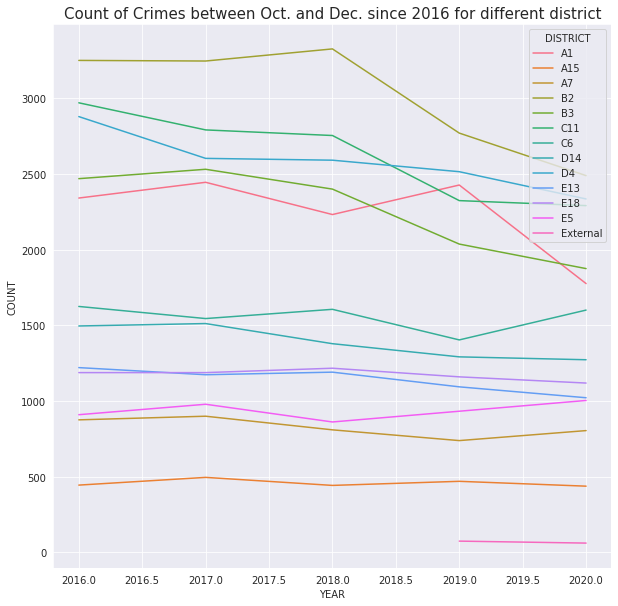

In [126]:
Crimes_all_years2 = Crimes_all_years[Crimes_all_years['MONTH'].isin([10,11,12])]
crimes_year = Crimes_all_years2.groupby(['YEAR','DISTRICT'])['INCIDENT_NUMBER'].aggregate(COUNT = 'count')
sns.set_context({"figure.figsize":(10,10)})
ax = sns.lineplot(data=crimes_year,x='YEAR',y='COUNT',hue='DISTRICT')
ax.set_title('Count of Crimes between Oct. and Dec. since 2016 for different district', fontdict= {'fontsize':15});

* Based on the graph, we can tell that those dangerous districts are experiencing an decreasing trend on the crime rate over the years. For safer districts, there are no significant changes.

###Does the month make a diffrence on reported case amount in each district?
(we excluded 2019's data for the month comparision)

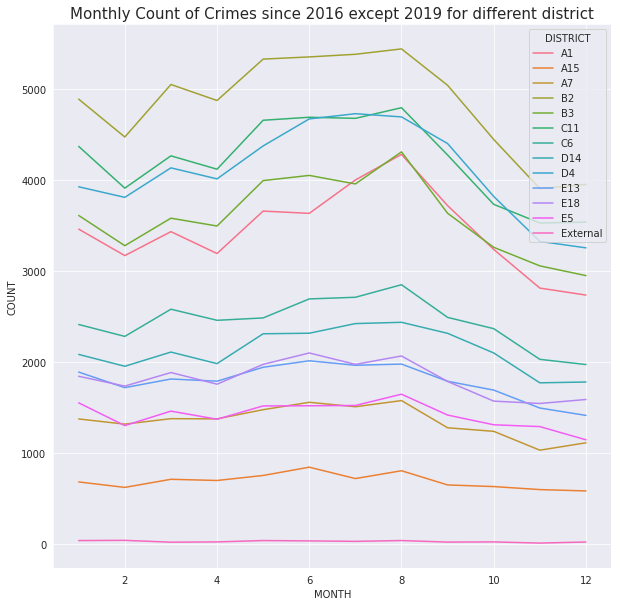

In [127]:
Crimes_all_years3=Crimes_all_years[Crimes_all_years['YEAR']!=2019]
crimes_year = Crimes_all_years3.groupby(['MONTH','DISTRICT'])['INCIDENT_NUMBER'].aggregate(COUNT = 'count')
sns.set_context({"figure.figsize":(10,10)})
ax = sns.lineplot(data=crimes_year,x='MONTH',y='COUNT',hue='DISTRICT')
ax.set_title('Monthly Count of Crimes since 2016 except 2019 for different district', fontdict= {'fontsize':15});

* Based on the graph, we noticed that districts with higher crime rate tend to be more sensitive to the month change, and Aug. tends to have an higher crime rate within the year.

###Does the day of week make a difference on reported case amount per district?
( we included 2019's data for this analysis)

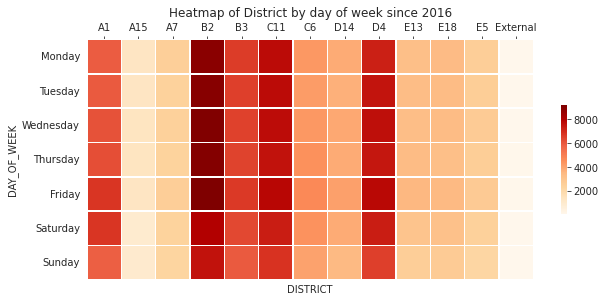

In [128]:
crimes_District_weeksdays = Crimes_all_years.groupby(['DAY_OF_WEEK','DISTRICT'])['INCIDENT_NUMBER'].aggregate('count').unstack()
crimes_District_weeksdays = crimes_District_weeksdays.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_District_weeksdays,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.2}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of District by day of week since 2016');

* Based on the heatmap, we noticed that most of the districts are not senstive to the day of week as a feature.

###Does Holiday make an diffence on the amount of crime reported per district?

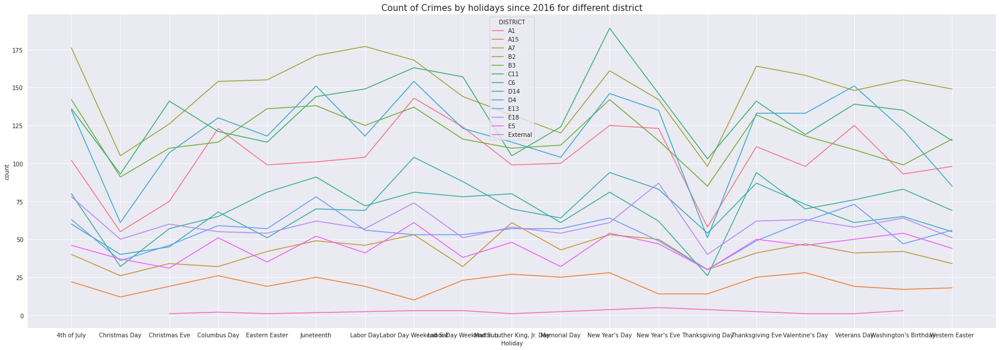

In [129]:
crime_district_holiday=crimes_holidays[crimes_holidays.Holiday.isna()==False].groupby(['Holiday','DISTRICT']).INCIDENT_NUMBER.aggregate(count = 'count')
sns.set_context({"figure.figsize":(30,10)})
ax = sns.lineplot(data=crime_district_holiday,x='Holiday',y='count',hue='DISTRICT')
ax.set_title('Count of Crimes by holidays since 2016 for different district', fontdict= {'fontsize':15});


* Most of the districts are sensitive to the holiday. New Year's day, thanksgiving evening, and 4th of July tend to have an higher than average crime rate comparing to other holiday. Christmas day and thanksgiving day are tend to be safer.

## Mark Cluster Map



In [130]:
df=pd.read_csv("/content/crimes_all_years.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (1,3,7,13) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)




*   Creating a new dataframe called 'df1' and sorting it  by district to get a random sample of the data by different years to plot it on the chloropleth map using latitude and longitude.



In [131]:
df1 = df.sort_values(by='DISTRICT').reset_index()

In [132]:
limit = 1000
df1 = df1.iloc[0:limit, :]
print(len(df1))

1000




*   Checking for (0.0,0.0) latitude and longitude and excluding them from the datframe to get rid of outliers in the map.



In [133]:
df1=df1.dropna(subset=['Long'])
df1=df1.dropna(subset=['Lat'])
df1=df1.dropna(subset=['OFFENSE_CODE_GROUP'])

In [134]:
df1= df1[df1.Lat != 0.0]
df1

,index,Unnamed: 0,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,110869,11439,I172096315,802,Simple Assault,ASSAULT SIMPLE - BATTERY,A1,111,NaN,2017-11-18 13:15:00,2017,11,Saturday,13,Part Two,TREMONT ST,42.354284,-71.063804,"(42.35428377, -71.06380404)"
4,102309,2879,I172105402,3125,Warrant Arrests,WARRANT ARREST,A1,117,NaN,2017-12-21 19:43:00,2017,12,Thursday,19,Part Three,BOYLSTON ST,42.352341,-71.062970,"(42.35234140, -71.06296987)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,100705,1275,I172107192,613,Larceny,LARCENY SHOPLIFTING,A1,111,NaN,2017-12-29 18:35:00,2017,12,Friday,18,Part One,WASHINGTON ST,42.352729,-71.062563,"(42.35272948, -71.06256291)"
995,100704,1274,I172107193,3018,Medical Assistance,SICK/INJURED/MEDICAL - POLICE,A1,63,NaN,2017-12-29 19:12:00,2017,12,Friday,19,Part Three,NEW SUDBURY ST,42.361839,-71.059765,"(42.36183857, -71.05976489)"


In [135]:
df1.OFFENSE_CODE_GROUP.isna().sum()

0

In [136]:
df1[df1.Long==0.0]
df1[df1.Lat==0.0]

,index,Unnamed: 0,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location


In [137]:
latitude = 42.3601
longitude = -71.0589
boston_map = folium.Map(location=[latitude, longitude], zoom_start=12)
boston_map



*   Marking locations on the graph by latitude and longitude and labeling the places with respective offense group codes.


In [138]:
incidents = folium.map.FeatureGroup()
for lat, lng, in zip(df1.Lat, df1.Long):
 incidents.add_child(
 folium.CircleMarker(
 [lat, lng],
 radius=5, 
 color='yellow',
 fill=True,
 fill_color='blue',
 fill_opacity=0.6
 )
)
boston_map.add_child(incidents)

In [139]:
incidents = folium.map.FeatureGroup()
for lat, lng, code,year in zip(df1.Lat, df1.Long,df1.OFFENSE_CODE_GROUP,df1.YEAR):
 incidents.add_child(
 folium.CircleMarker(
 [lat, lng],
 radius=5, 
 color='yellow',
 fill=True,
 fill_color='red',
 fill_opacity=0.6
   )
 )
latitudes = list(df1.Lat)
longitudes = list(df1.Long)
labels = list(df1.OFFENSE_CODE_GROUP)
years=list(df1.YEAR)
for lat, lng, labels,year in zip(latitudes, longitudes, labels,years):
  folium.Marker([lat, lng], popup='{}, {}'.format(labels,year)).add_to(boston_map) 
 

boston_map.add_child(incidents)
 

In [140]:
from folium import plugins
boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
incidents = plugins.MarkerCluster().add_to(boston_map)
for lat, lng, label,year in zip(df1.Lat, df1.Long, df1.OFFENSE_CODE_GROUP,df1.YEAR):
 folium.Marker(
 location=[lat, lng],
 icon=None,
 popup='{}, {}'.format(label,year),
 ).add_to(incidents)
# display map
boston_map

## HEAT MAP


*   A heat map is plotted using latitude and longitude and the color gradients on it indicate the magnitude of crimes in that place.



In [141]:
from folium import Choropleth, Circle, Marker, Map
from folium.plugins import HeatMap, MarkerCluster
import plotly.express as px
import plotly.graph_objects as go
import math

In [142]:
latitude = 42.3601
longitude = -71.0589
boston_map = folium.Map(location=[latitude, longitude], zoom_start=12)
boston_map



*   The count of crimes are classified with numbers and different colors show the count of crimes in that area on the heat map.



In [143]:
location=df.groupby(['Lat','Long','OFFENSE_CODE_GROUP']).size().reset_index(name='count').sort_values(by='count',ascending=False)
location=location[location['count']>=5]
location['color']=location['count'].apply(lambda count:"Black" if count>=400 else
                                         "green" if count>=300 and count<400 else
                                         "Orange" if count>=200 and count<300 else
                                         "darkblue" if count>=150 and count<200 else
                                         "red" if count>=100 and count<150 else
                                         "lightblue" if count>=75 and count<100 else
                                         "brown" if count>=50 and count<75 else
                                         "grey")
location['size']=location['count'].apply(lambda count:12 if count>=400 else
                                         10 if count>=300 and count<400 else
                                         8 if count>=200 and count<300 else
                                         6 if count>=150 and count<200 else
                                         4 if count>=100 and count<150 else
                                         2 if count>=75 and count<100 else
                                         1 if count>=50 and count<75 else
                                         0.1)
location

,Lat,Long,OFFENSE_CODE_GROUP,count,color,size
91859,42.348624,-71.082776,Larceny,760,Black,12.0
19730,42.284826,-71.091374,Drug Violation,457,Black,12.0
...,...,...,...,...,...,...
72925,42.332714,-71.035293,Towed,5,grey,0.1
26871,42.290425,-71.090491,Verbal Disputes,5,grey,0.1


In [144]:

m=folium.Map([42.3602,-71.0589],zoom_start=11)
location=location[0:2000]
for lat,lon,color,count,size,off in zip(location['Lat'],location['Long'],location['color'],location['count'],location['size'],location['OFFENSE_CODE_GROUP']):
     folium.CircleMarker([lat, lon],
                            popup=off,
                            radius=size,
                            color='b',
                            fill=True,
                            fill_opacity=0.7,
                            fill_color=color,
                           ).add_to(m)

#m.save('boston_crime.html')
m


* From the above map , we can see the bigger sized black circle (count>=400) has had the highest crimes. Be careful!.

In [145]:
# convert to (n, 2) nd-array format for heatmap
location1=location[0:200]
location_data = location[['Lat', 'Long']].values

# plot heatmap
m.add_child(plugins.HeatMap(location_data, radius=15))
#m.save('heatmap.html')
m



*   The heatmap above shows the intensity of crimes in each place at Boston.



# **Findings**


2019's data has been excluded from analysis due to incomplete statistics.
1. The numbers of criminal cases had a huge drop in 2020, camparing to previous years, probably because of the Covid-19 pandemics.
2. Sumemr has the highest ciminal case frequency, Spring is the next.
3. In general, crimes occurred more often during daytime than nighttime between Monday and Friday. The peak hours are noon and 4-6 pm. 0 am has the highest ciminal case frequency at night thoughout the week.
4. For holidays, Labor Day Weekend Saturday and New Year's Day have the highest crime rate while Christmas and Thanksgiving have the lowest crime rate.
5. Among all types of crime reports, Motor Vehicle Accident Response is the most frequent one. It generally occurred on commuting time during weekdays, as well as 0-2 am and afternoon in weekends. 
6. Washington Steet is the most dangerous street in Boston.
7. Districts with higher averge crime rate are experiencing an decreasing trend throughout 2016 to 2020.( 2019 data was included in this part of analysis, we only used Oct to Dec data from each year.)
8. Most of the districts' crime rate are senestive to change on the month and holiday, but most of them are not sensetive to change on the day of week.


# **Further Analysis**

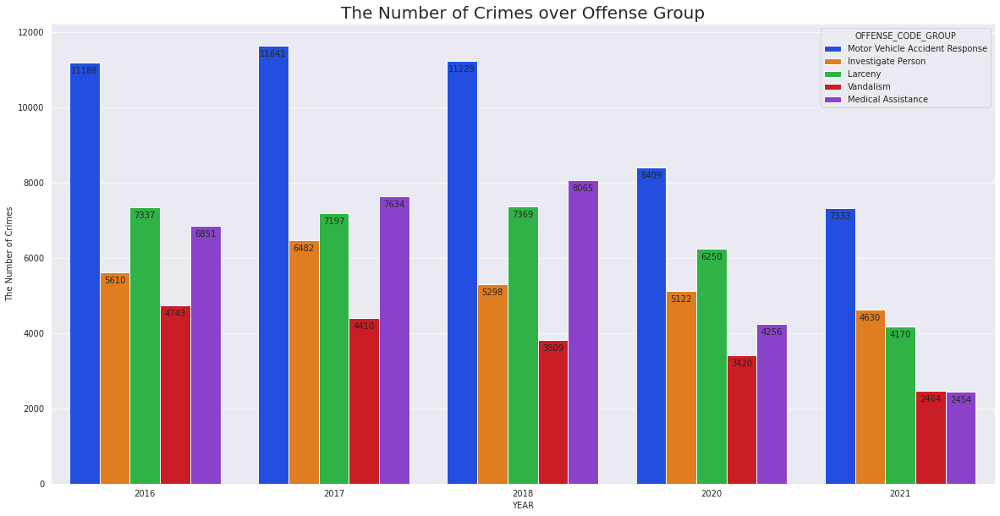

In [155]:
# number of crimes over offense groups by year

df = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['OFFENSE_CODE_GROUP','YEAR'])['INCIDENT_NUMBER'].count().reset_index()
df = df.sort_values(by=['YEAR','INCIDENT_NUMBER'], ascending=False)
df = df[df['OFFENSE_CODE_GROUP'].isin(dftop6.OFFENSE_CODE_GROUP)]

df[df.YEAR==2021]
plt.figure(figsize= (20,10))
fig2 = sns.barplot(data=df, x='YEAR', y='INCIDENT_NUMBER', hue='OFFENSE_CODE_GROUP')
plt.ylabel('The Number of Crimes')
plt.title('The Number of Crimes over Offense Group', fontsize=20)

for i in fig2.patches:
    fig2.annotate(format(int(i.get_height())), 
                   (i.get_x() + i.get_width() / 2, i.get_height()), 
                   ha = 'center', va = 'center', 
                   size=10,
                   xytext = (0, -10), 
                   textcoords = 'offset points')
    
plt.show()

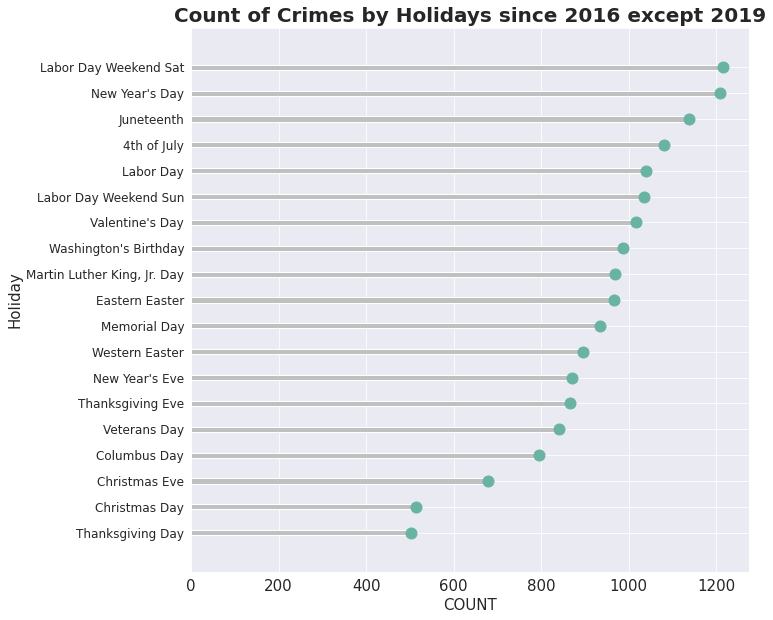

In [147]:
sns.set_context({"figure.figsize":(10,10)})
crimes_holiday=crimes_holidays[(crimes_holidays.YEAR!=2019) & (crimes_holidays.Holiday.isna()==False)].groupby('Holiday').INCIDENT_NUMBER.agg(count = 'count').sort_values(by='count',ascending=True)
crimes_holiday = pd.DataFrame({'Holiday':crimes_holiday.index,'COUNT':crimes_holiday['count']})
fig, axes = plt.subplots()
axes.barh(crimes_holiday['Holiday'], crimes_holiday['COUNT'],color='silver',height=0.2)
axes.plot(crimes_holiday['COUNT'], crimes_holiday['Holiday'], "o",color="#69b3a2",markersize=11)
axes.set_xlim(0)
  
# formatting and details
plt.xlabel('COUNT',fontdict={'fontsize':15})
plt.ylabel('Holiday',fontdict={'fontsize':15})
plt.title('Count of Crimes by Holidays since 2016 except 2019', fontdict= {'fontsize':20, 'fontweight':'bold'})
plt.yticks(crimes_holiday['Holiday'],fontsize=12)
bottom,top=plt.ylim()
plt.ylim(bottom - 0.5, top + 0.5)
plt.xticks(fontsize=15);

###Did the pattern for day of week vary a lot in different years?

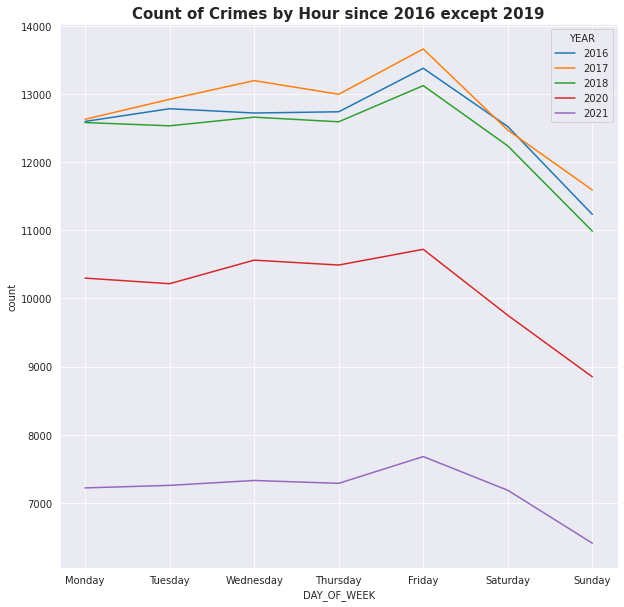

In [148]:
crimes_weekday = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['DAY_OF_WEEK','YEAR']).size().to_frame('count')
def sort():
    weekday= ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    YEAR = [2016, 2017, 2018, 2020, 2021]
    return [(i,j) for i in weekday for j in YEAR]
crimes_weekday = crimes_weekday.reindex(sort())
ax = sns.lineplot(data=crimes_weekday,x='DAY_OF_WEEK',y='count',hue='YEAR',palette='tab10')
ax.set_title('Count of Crimes by Hour since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   From the above line chart, 2016 to present except 2019 which is excluded because of missing data, generally have the same pattern on active hour of crime cases. Moreover, it is obvious that the general crime rate dropped in 2020, probably due to the Covid-19 pandemics.



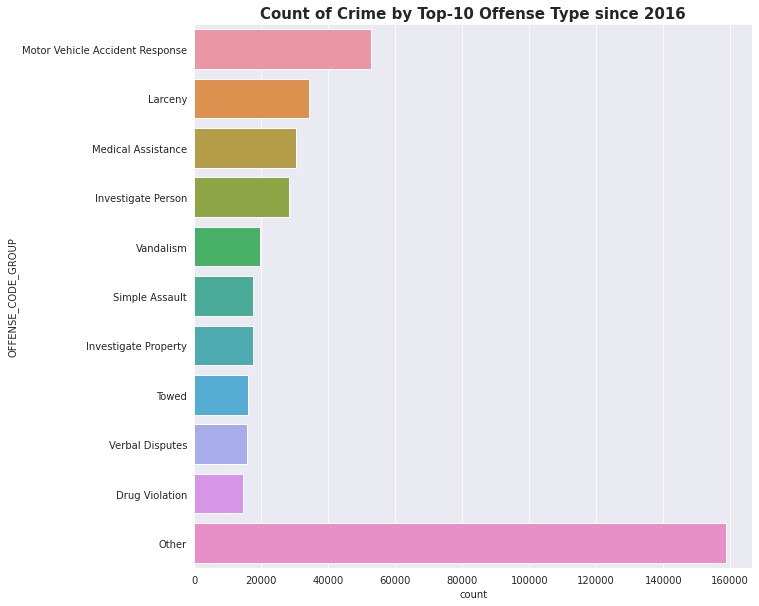

In [149]:
sns.set_style('darkgrid')
sns.set_context({"figure.figsize":(10,10)})
crimes_rank = Crimes_all_years.groupby('OFFENSE_CODE_GROUP').size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
crimes_rank_10 = crimes_rank[crimes_rank.OFFENSE_CODE_GROUP!='Other'][:10]
other = sum(crimes_rank['count'])-sum(crimes_rank_10['count'])
crimes_rank_10 = pd.concat([crimes_rank_10,pd.DataFrame({'OFFENSE_CODE_GROUP':['Other'],'count':[other]})],ignore_index=True)
ax = sns.barplot(data=crimes_rank_10,y='OFFENSE_CODE_GROUP',x='count')
ax.set_title('Count of Crime by Top-10 Offense Type since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'});

###Larceny, the second frequent case type, were more likely to be reported at what time?

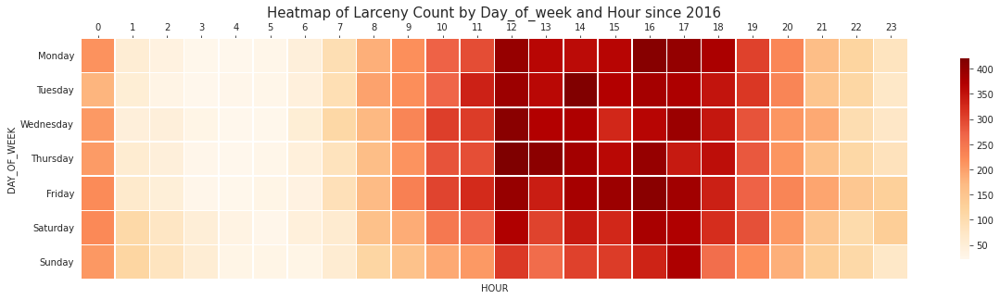

In [150]:
sns.set_context({"figure.figsize":(20,5)})
crimes_weekday_hour = Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Larceny'].groupby(['DAY_OF_WEEK','HOUR'])['index'].aggregate('count').unstack()
crimes_weekday_hour = crimes_weekday_hour.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_weekday_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Larceny Count by Day_of_week and Hour since 2016', fontdict= {'fontsize':15});



*   For larceny cases, they occurred generally in afternoons, especially on weekdays, however, the cases also happened at 0 am a lot.


###Medical Assitance, the third frequent case type, were more likely to be reported at what time?

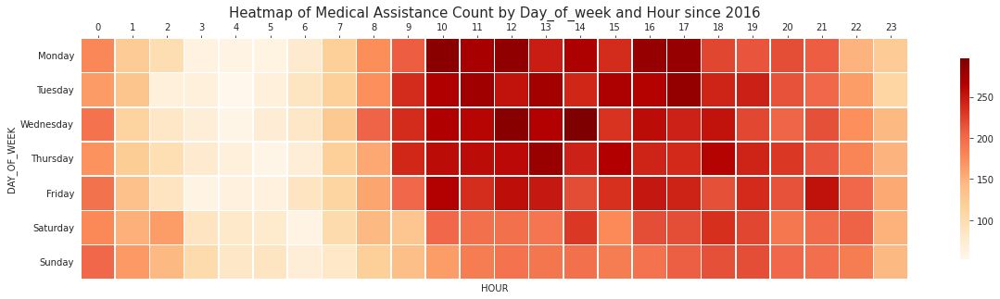

In [151]:
sns.set_context({"figure.figsize":(20,5)})
crimes_weekday_hour = Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Medical Assistance'].groupby(['DAY_OF_WEEK','HOUR'])['index'].aggregate('count').unstack()
crimes_weekday_hour = crimes_weekday_hour.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_weekday_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Medical Assistance Count by Day_of_week and Hour since 2016', fontdict= {'fontsize':15});



*   Medical Assistance case more often occurred in daytime of weekdays.



Text(0.5, 1.0, 'Heatmap of District by Year')

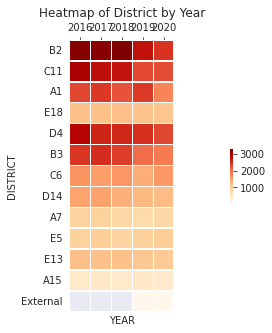

In [152]:
Crimes_all_years2 = Crimes_all_years[Crimes_all_years['MONTH'].isin([10,11,12])]
crimes_District_year = Crimes_all_years2.groupby(['DISTRICT','YEAR'])['INCIDENT_NUMBER'].aggregate('count').unstack()
crimes_District_year = crimes_District_year.reindex(['B2', 'C11', 'A1', 'E18', 'D4', 'B3', 'C6', 'D14', 'A7', 'E5',
       'E13', 'A15', 'External'])
ax = sns.heatmap(crimes_District_year,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.2}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of District by Year')

Text(0.5, 1.0, 'Heatmap of District by Month')

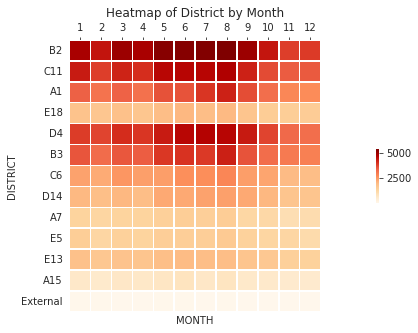

In [153]:
Crimes_all_years3=Crimes_all_years[Crimes_all_years['YEAR']!=2019]
crimes_District_month = Crimes_all_years3.groupby(['DISTRICT','MONTH'])['INCIDENT_NUMBER'].aggregate('count').unstack()
crimes_District_month = crimes_District_month.reindex(['B2', 'C11', 'A1', 'E18', 'D4', 'B3', 'C6', 'D14', 'A7', 'E5',
       'E13', 'A15', 'External'])
ax = sns.heatmap(crimes_District_month,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.2}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of District by Month')